# Lexical norms from Lancaster Sensorimotor Norms
Single predictor models using [Lancaster Sensorimotor Norms](https://www.lancaster.ac.uk/psychology/lsnorms).

In [44]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [45]:
from tools.create import create_single_models
from tools.base import (dump_collection, load_collection, 
                        flatten_collection, compute_metrics,
                        _extract_regressors)
from tools.viz import (plot_regressor, plot_regressor,
                       plot_metrics, plot_contrast_by_dataset, plot_contrast_by_analysis,
                       plot_analysis_grid)
from pyns import Neuroscout
import numpy as np
from matplotlib import pyplot as plt
from pathlib import Path
%matplotlib inline

Set up API by importing credentials as environment variables.

In [46]:
api = Neuroscout()

## Define predictors and confounds

In [47]:
predictors = ['lancastersensorimotornorms_Visual.mean', 'lancastersensorimotornorms_Auditory.mean',
             'lancastersensorimotornorms_Olfactory.mean', 'lancastersensorimotornorms_Haptic.mean',
             'lancastersensorimotornorms_Gustatory.mean', 'lancastersensorimotornorms_Interoceptive.mean',
             'lancastersensorimotornorms_Foot_leg.mean', 'lancastersensorimotornorms_Hand_arm.mean',
             'lancastersensorimotornorms_Head.mean', 'lancastersensorimotornorms_Mouth.mean',
             'lancastersensorimotornorms_Torso.mean']

In [48]:
prioritize = ['lancastersensorimotornorms_Visual.mean', 'lancastersensorimotornorms_Auditory.mean',
             'lancastersensorimotornorms_Interoceptive.mean',
            'lancastersensorimotornorms_Hand_arm.mean']

In [49]:
confounds = ['a_comp_cor_00', 'a_comp_cor_01', 'a_comp_cor_02', 'a_comp_cor_03', 'a_comp_cor_04', 'a_comp_cor_05', 'trans_x', 'trans_y', 'trans_z', 'rot_x', 'rot_y', 'rot_z']

In [50]:
control = ['speech']

## Create single predictor models

In [5]:
transformations = [{"Name": "Scale", 
                    "Demean": True, 
                    "Rescale": True,
                    "ReplaceNA": "after", 
                    "Input": [p]} for p in predictors]

NameError: name 'predictors' is not defined

In [6]:
filename = Path('models') / 'lexical_sensorimotor_norms.json'

In [212]:
# dump_collection(single_models, filename)

In [8]:
single_models = load_collection(filename)

## Generate reports

In [10]:
for (pred, dataset, task), model in flatten_collection(single_models):
    model.generate_report(run_id=model.runs[0])

In [11]:
for p in predictors:
    single_models[p]['Budapest']['movie'].plot_report()

## Inspect regressors

In [12]:
df = _extract_regressors(single_models)

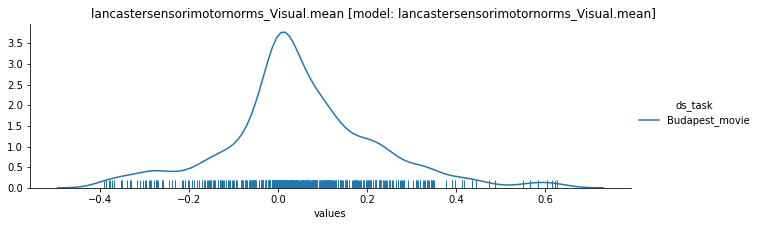

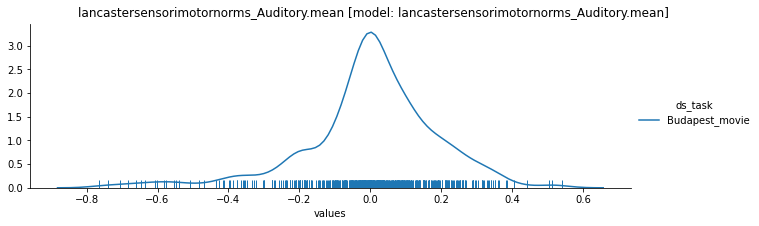

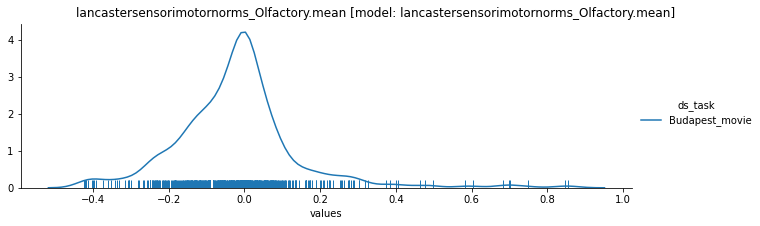

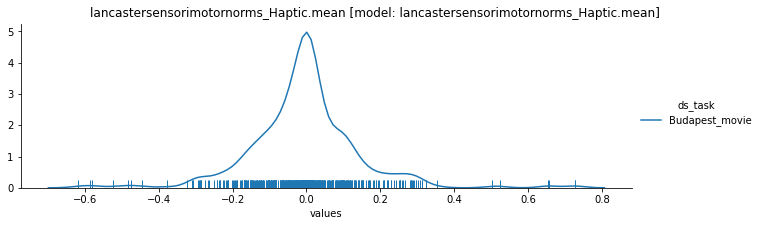

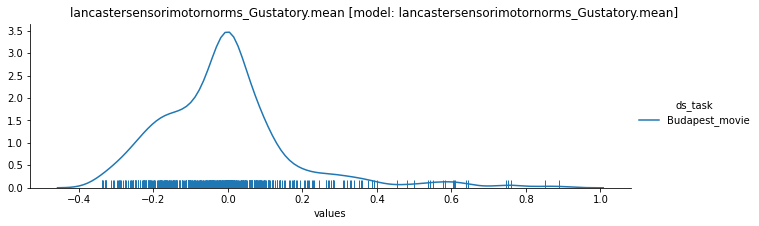

...

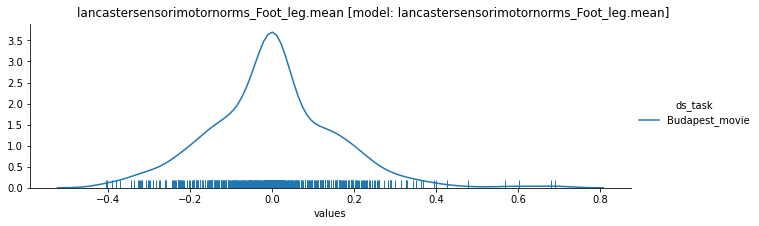

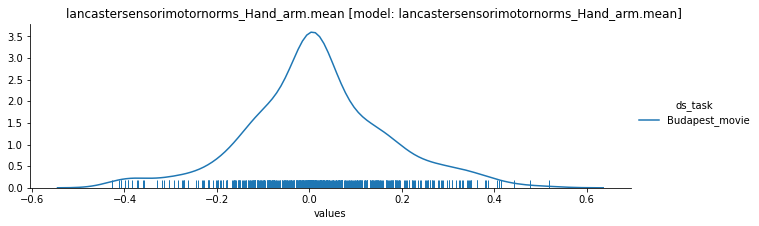

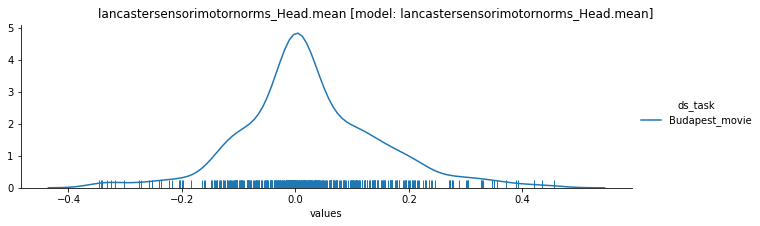

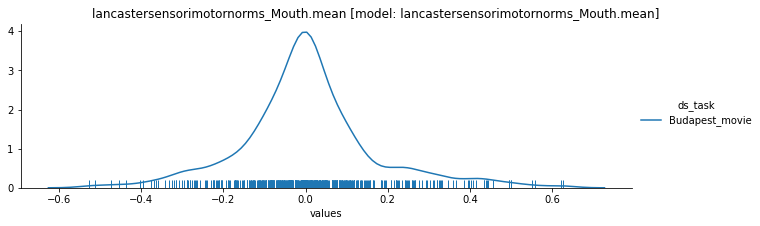

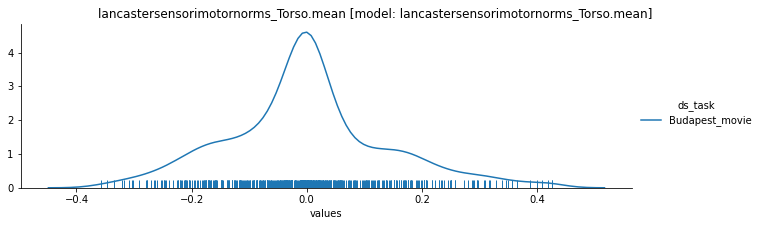

In [13]:
plot_regressor('distribution', df=df, split_by='hue', color=None, aspect=3, hist=None, rug=True)

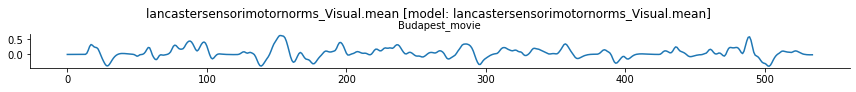

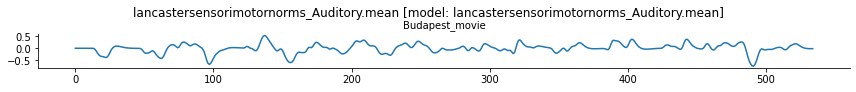

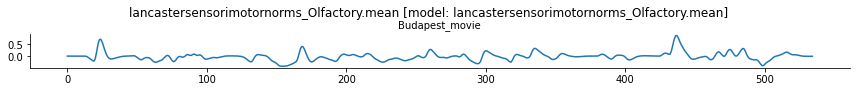

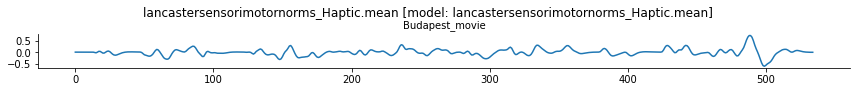

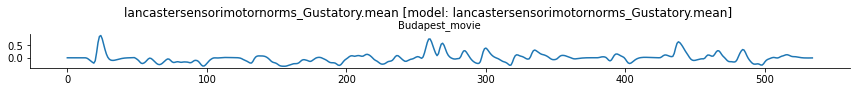

...

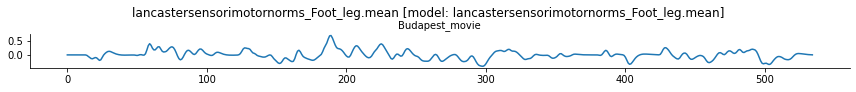

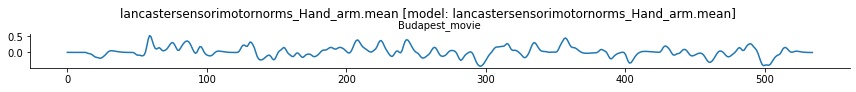

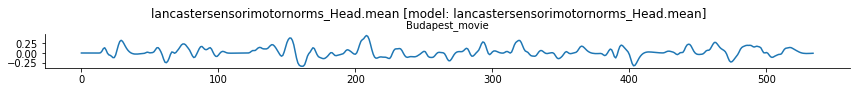

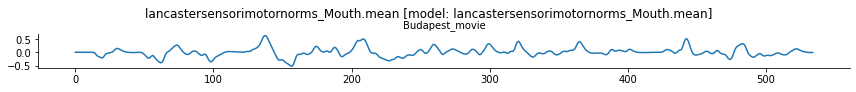

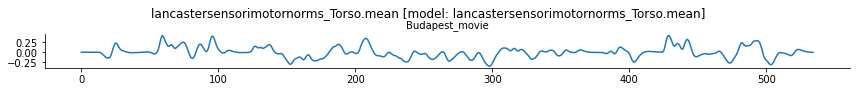

In [14]:
plot_regressor('timeseries', df=df, split_by='row', height=1.2, aspect=10)

In [15]:
agg_df = compute_metrics(df=df, aggfunc=[np.mean, np.std, np.var])

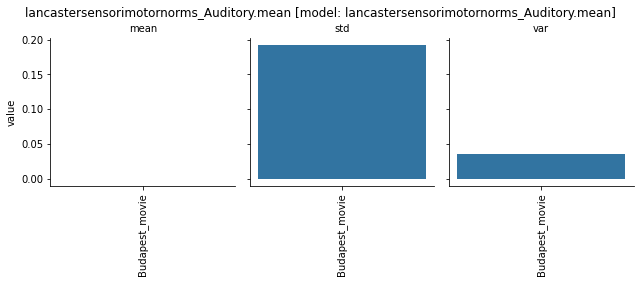

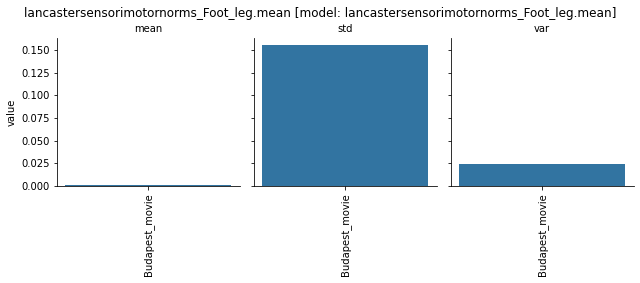

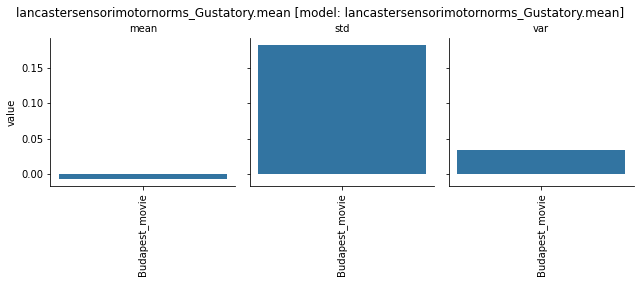

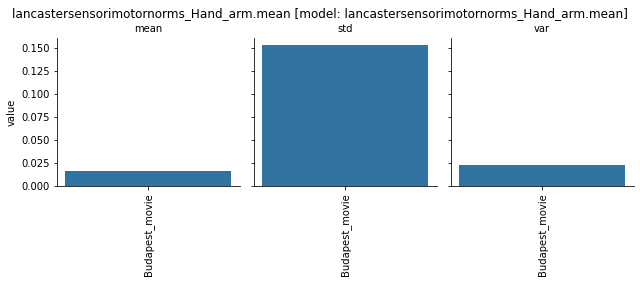

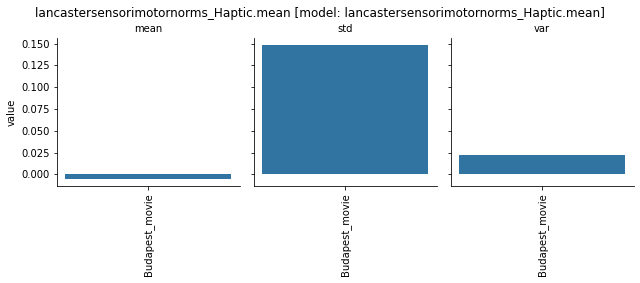

...

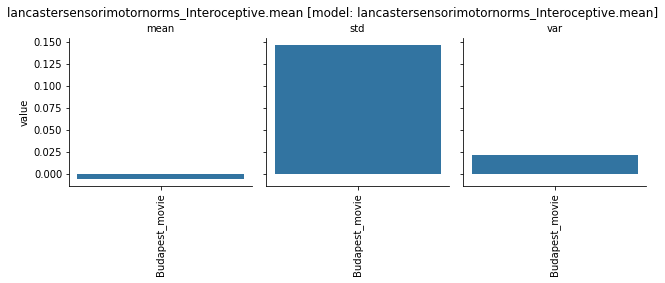

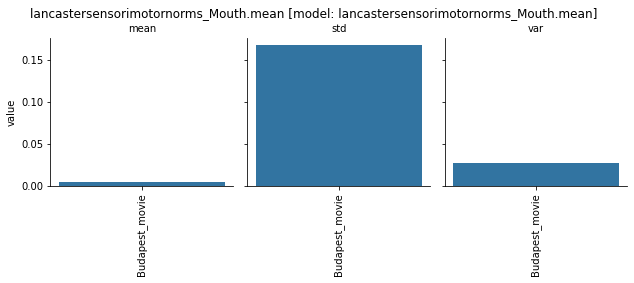

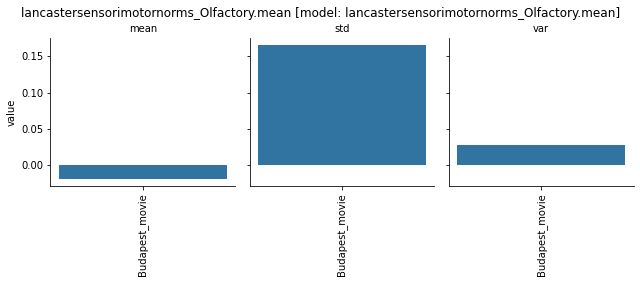

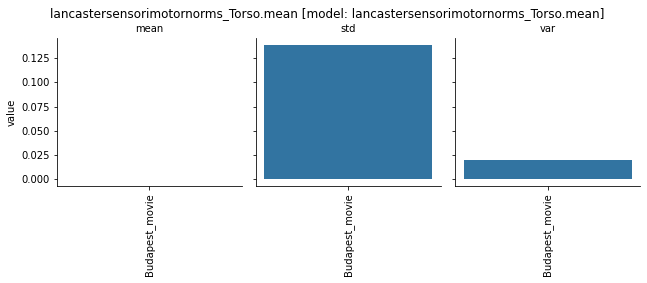

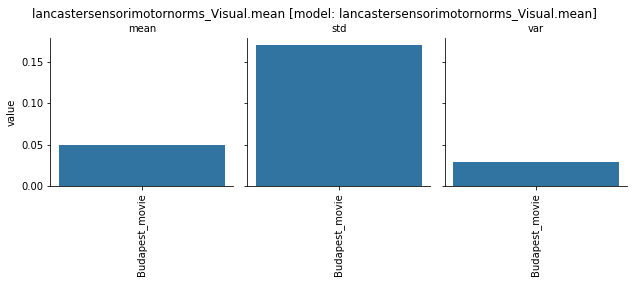

In [16]:
plot_metrics(agg_df, metrics=['mean', 'std', 'var'],
             sns_function='barplot', height=3, aspect=1)

## Compile models

In [28]:
for (pred, dataset, task), model in flatten_collection(single_models):
    if model.get_status()['status'] == 'DRAFT':
        model.private = False
        model.push()
        model.compile()
    else:
        print(f'{pred} {model.status} for {dataset}')

lancastersensorimotornorms_Auditory.mean PASSED for Budapest
lancastersensorimotornorms_Auditory.mean PASSED for HealthyBrainNetwork
lancastersensorimotornorms_Auditory.mean PASSED for LearningTemporalStructure
lancastersensorimotornorms_Auditory.mean PASSED for Life
lancastersensorimotornorms_Auditory.mean PASSED for ParanoiaStory
lancastersensorimotornorms_Auditory.mean PASSED for Raiders
lancastersensorimotornorms_Auditory.mean PASSED for SchematicNarrative
lancastersensorimotornorms_Auditory.mean PASSED for Sherlock
lancastersensorimotornorms_Auditory.mean PASSED for SherlockMerlin
lancastersensorimotornorms_Auditory.mean PASSED for SherlockMerlin
lancastersensorimotornorms_Foot_leg.mean PASSED for Budapest
lancastersensorimotornorms_Foot_leg.mean PASSED for HealthyBrainNetwork
lancastersensorimotornorms_Foot_leg.mean PASSED for LearningTemporalStructure
lancastersensorimotornorms_Foot_leg.mean PASSED for Life
lancastersensorimotornorms_Foot_leg.mean PASSED for ParanoiaStory
lancas

In [42]:
' '.join([model.hash_id for (pred, dataset, task), model in flatten_collection(single_models) 
          if not model.get_uploads() and model.get_status()['status'] == 'PASSED' and dataset == 'narratives' and pred in prioritize])

''

In [43]:
' '.join([model.hash_id for (pred, dataset, task), model in flatten_collection(single_models) 
          if not model.get_uploads() and model.get_status()['status'] == 'PASSED' and dataset == 'NaturalisticNeuroimagingDatabase' and pred in prioritize])

''

In [40]:
len(api.analyses.get('qqeow')['model']['Input']['Subject'])

31

## Results

In [10]:
flat_models = flatten_collection(single_models)

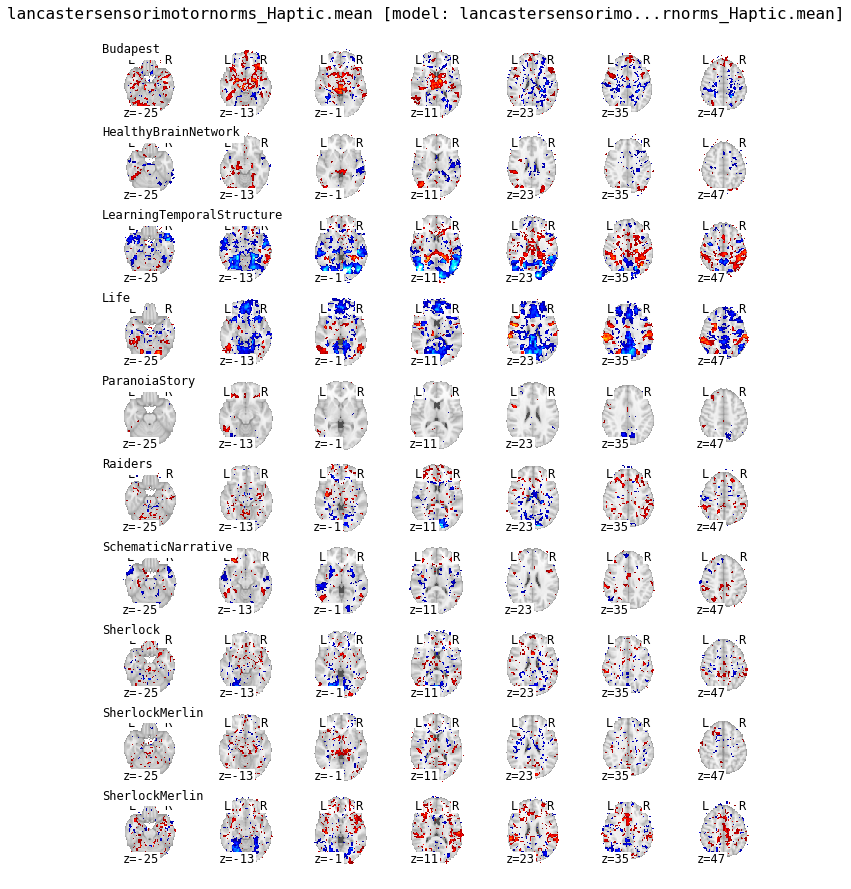

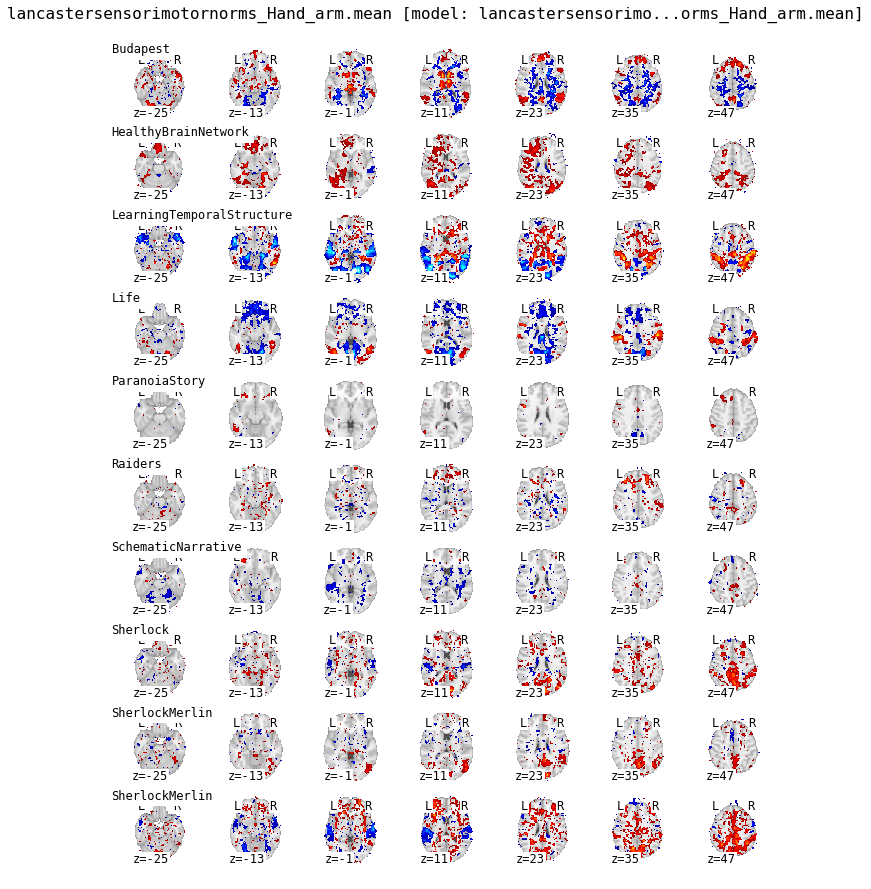

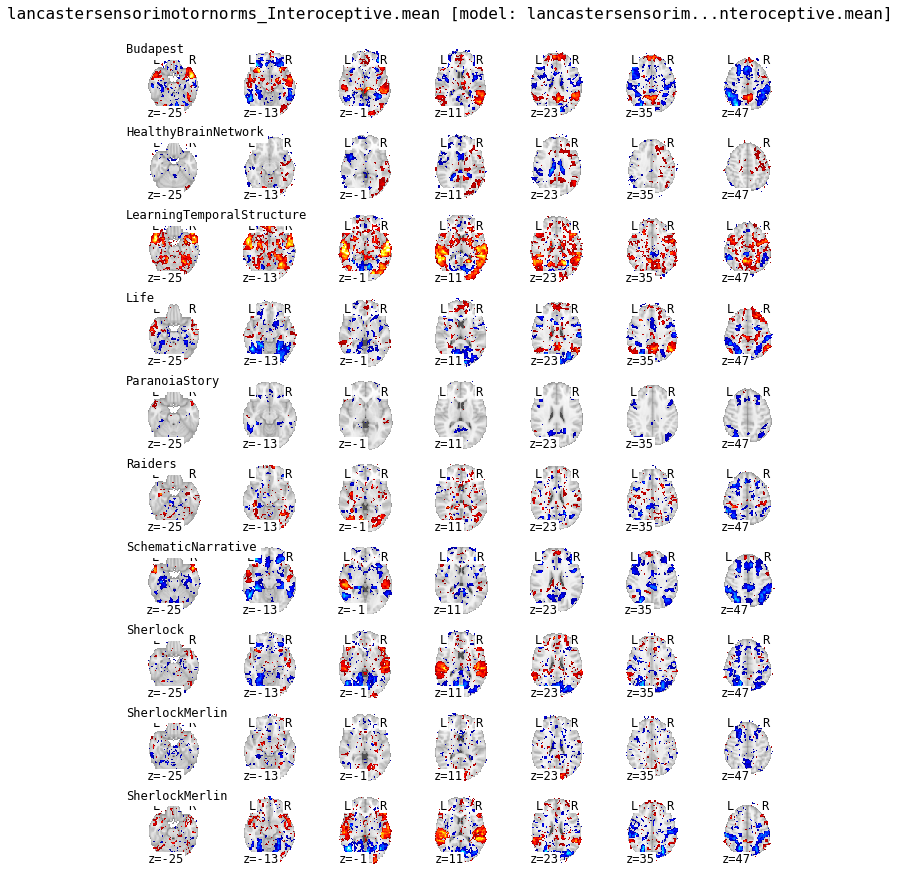

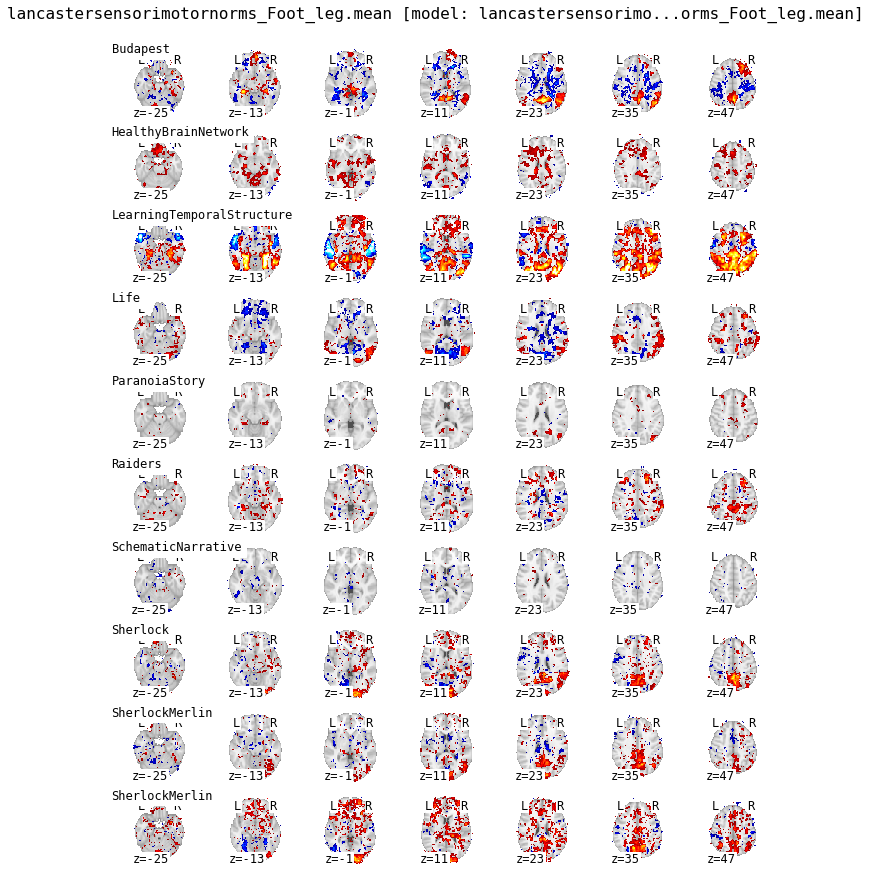

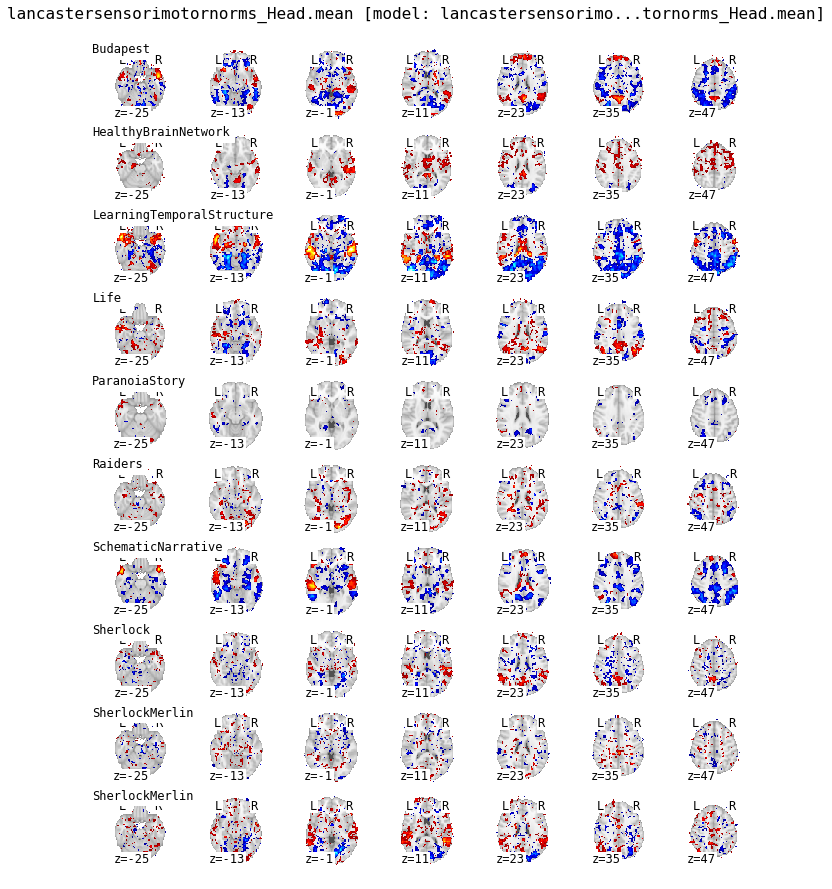

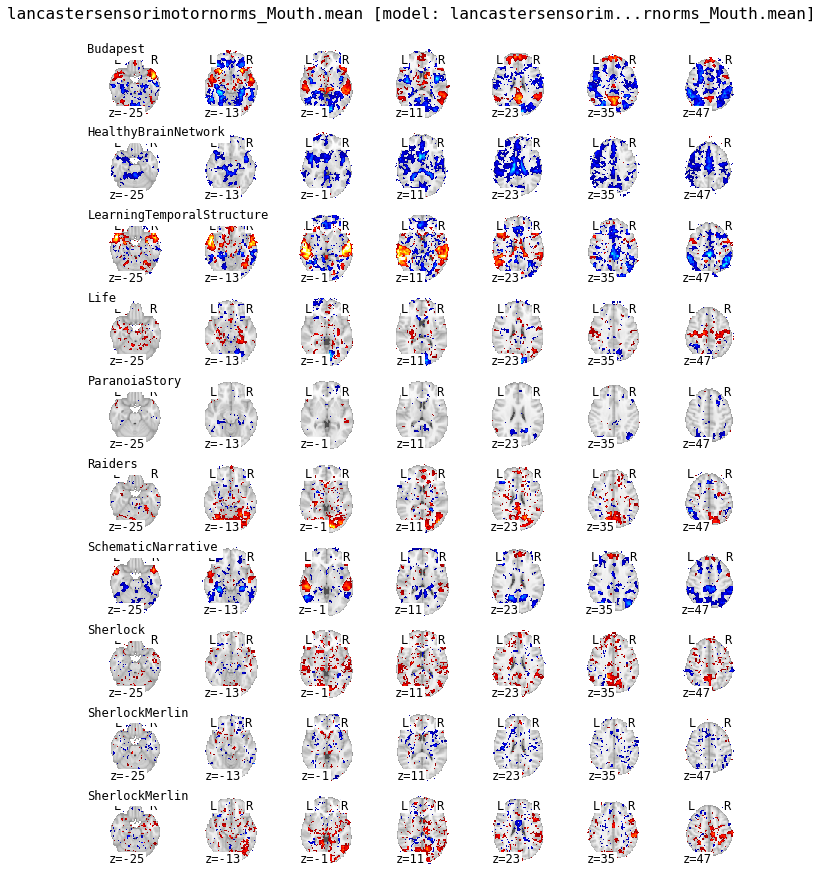

In [ ]:
plt.rcParams.update({'font.family': 'monospace'})
plot_contrast_by_analysis(flat_models, contrasts=predictors,
                          vmax=10, display_mode='z', figsize=(12,15),
                          threshold=1.96, colorbar=False)

# Big Sensorimotor Norms Model

In [55]:
from tools.create import _get_datasets

In [72]:
all_preds = prioritize + ['lancastersensorimotornorms_Foot_leg.mean', 'subtlexusfrequency_Lg10WF', 'speech', 'concreteness_Conc.M']

In [123]:
all_preds

['lancastersensorimotornorms_Visual.mean',
 'lancastersensorimotornorms_Auditory.mean',
 'lancastersensorimotornorms_Interoceptive.mean',
 'lancastersensorimotornorms_Hand_arm.mean',
 'lancastersensorimotornorms_Foot_leg.mean',
 'subtlexusfrequency_Lg10WF',
 'speech',
 'concreteness_Conc.M']

In [58]:
name = 'big_sensorimotor_model'

In [87]:
transformations = [{"Name": "Scale", 
                    "Demean": True, 
                    "Rescale": True,
                    "ReplaceNA": "after", 
                    "Input": [p]} for p in all_preds if p != 'speech']

In [88]:
datasets = _get_datasets(None)

single_models[name] = {}
for ds_name, ds_values in datasets.items(): 
    if ds_name == 'NaturalisticNeuroimagingDatabase':
        cf = []
    else:
        cf = confounds
    single_models[name][ds_name] = {}
    for task_name in ds_values['tasks']:
        try:
            single_models[name][ds_name][task_name] = api.analyses.create_analysis(
                name=name, 
                dataset_name=ds_name, 
                predictor_names=cf + all_preds,
                tasks=task_name,
                transformations=transformations,
                hrf_variables=all_preds,
                dummy_contrasts='hrf')
        except ValueError as e:
            print(f"Dataset: {ds_name}, Task: {task_name}, Predictors: {preds}", e)

Dataset: studyforrest, Task: movie, Predictors: ['lancastersensorimotornorms_Visual.mean', 'lancastersensorimotornorms_Auditory.mean', 'lancastersensorimotornorms_Interoceptive.mean', 'lancastersensorimotornorms_Hand_arm.mean', 'lancastersensorimotornorms_Foot_leg.mean', 'subtlexusfrequency_Lg10WF', 'speech', 'concreteness_Conc.M', 'speech'] Not all named predictors could be found for the specified runs.
Dataset: narratives, Task: notthefalllongscram, Predictors: ['lancastersensorimotornorms_Visual.mean', 'lancastersensorimotornorms_Auditory.mean', 'lancastersensorimotornorms_Interoceptive.mean', 'lancastersensorimotornorms_Hand_arm.mean', 'lancastersensorimotornorms_Foot_leg.mean', 'subtlexusfrequency_Lg10WF', 'speech', 'concreteness_Conc.M', 'speech'] Not all named predictors could be found for the specified runs.
Dataset: narratives, Task: notthefallshortscram, Predictors: ['lancastersensorimotornorms_Visual.mean', 'lancastersensorimotornorms_Auditory.mean', 'lancastersensorimotorno

In [89]:
for (dataset, task), model in flatten_collection(single_models[name]):
    if model.get_status()['status'] == 'DRAFT':
        model.private = False
        model.push()
        model.compile()
    else:
        print(f'{model.status} for {dataset}')

In [202]:
' '.join([m.hash_id for (dataset, task), m in flatten_collection(single_models[name]) 
          if m.get_status()['status'] == 'PASSED' and not m.get_uploads() and
          dataset not in  ['NaturalisticNeuroimagingDatabase', 'narratives']
         and len(m.runs) > 30])

''

In [211]:
single_models.keys()

dict_keys(['lancastersensorimotornorms_Visual.mean', 'lancastersensorimotornorms_Auditory.mean', 'lancastersensorimotornorms_Olfactory.mean', 'lancastersensorimotornorms_Haptic.mean', 'lancastersensorimotornorms_Gustatory.mean', 'lancastersensorimotornorms_Interoceptive.mean', 'lancastersensorimotornorms_Foot_leg.mean', 'lancastersensorimotornorms_Hand_arm.mean', 'lancastersensorimotornorms_Head.mean', 'lancastersensorimotornorms_Mouth.mean', 'lancastersensorimotornorms_Torso.mean', 'big_sensorimotor_model'])

In [203]:
' '.join([m.hash_id for (dataset, task), m in flatten_collection(single_models[name]) 
          if m.get_status()['status'] == 'PASSED' and not m.get_uploads() and
          dataset not in  ['NaturalisticNeuroimagingDatabase', 'narratives']
         and len(m.runs) < 30])

''

In [208]:
' '.join([m.hash_id for (dataset, task), m in flatten_collection(single_models[name]) 
          if m.get_status()['status'] == 'PASSED' and not m.get_uploads()
         and dataset == 'NaturalisticNeuroimagingDatabase' and task not in ['citizenfour', '500daysofsummer']])

'3jq66 kupc2 fetnr htcek in23u m4trx p5r2b'

In [209]:
' '.join([m.hash_id for (dataset, task), m in flatten_collection(single_models[name]) 
          if m.get_status()['status'] == 'PASSED' and not m.get_uploads()
         and dataset == 'NaturalisticNeuroimagingDatabase' and task in ['citizenfour', '500daysofsummer']])

''

In [206]:
' '.join([m.hash_id for (dataset, task), m in flatten_collection(single_models[name]) 
          if m.get_status()['status'] == 'PASSED' and not m.get_uploads()
         and dataset == 'narratives'
         and len(m.runs) < 30])

''

In [207]:
' '.join([m.hash_id for (dataset, task), m in flatten_collection(single_models[name]) 
          if m.get_status()['status'] == 'PASSED' and not m.get_uploads() and
          dataset == 'narratives'
         and len(m.runs) > 35])

''

## Fix SchematicNarrative

In [130]:
remove_runs = [1262, 1347, 1296, 1297, 1298, 1299]
remove_subject = '28'
fixed_models = []
for (pred, dataset, task), model in flatten_collection(single_models):
    if dataset == 'SchematicNarrative' and model.get_status()['status'] == 'FAILED':
        print(remove_runs[0] in model.runs)
        if remove_runs[0] in model.runs:
            for r in remove_runs:
                model.runs.remove(r)
            model.model['Input']['Subject'].remove('28')
            model.push()
        model.compile()
        fixed_models.append(model.hash_id)

True
